In [23]:
import sys
import pandas
import numpy
from sklearn.feature_extraction.text import CountVectorizer
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.linear_model import LinearRegression
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import PolynomialFeatures
from matplotlib import pyplot as plt
import  plotly.express  as px
from sklearn.naive_bayes import MultinomialNB
from scipy import stats
sys.version

'3.11.3 (tags/v3.11.3:f3909b8, Apr  4 2023, 23:49:59) [MSC v.1934 64 bit (AMD64)]'

In [24]:
text_file = open("stopWords.txt", "r", encoding='utf-8')
stopWords=(list(map(lambda x: x.strip().lower(),text_file.readlines())))
# print(stopwords)

csv=pandas.read_csv("./dataset.csv",sep=";")

def removeStopWords(txt):
    return " ".join([word for word in txt.split() if word.lower() not in stopWords])


# print(removeStopWords('test zwischen'))
csv["review_body"]=csv["review_body"].apply(lambda x: removeStopWords(x))
csv



,review_body,Results,Value
0,Produkt an. stocksauer! Trotz langen Lieferzei...,1,NaN
1,"Gebrauchte Spinner, teilzerlegt teilweise oxid...",1,NaN
2,Bestellungen jeweils Glühbirne defekt. Qualitä...,1,NaN
3,zurückgeschickt,1,NaN
4,"Fotos erkennen Glas schmal Display, schimmert ...",1,NaN
...,...,...,...
4995,Anleitung verwendet zufrieden. Super Ergebnis....,5,NaN
4996,"schnelle Lieferung , Super Preis Leistungsverh...",5,NaN
4997,Panzerglas beschreiben. kennt das. Wörter 20,5,NaN
4998,"einwandfrei, Lieferung, Produkt Service, schre...",5,NaN


In [25]:
# create the transform
vectorizerCount = CountVectorizer()
# tokenize and build vocab
vectorizerCount.fit(csv["review_body"])
# summarize
#print(vectorizerCount.vocabulary_)

# sample text
text = ["The quick brown fox jumped over the lazy dog."]


# encode document
vector = vectorizerCount.transform(text)
# summarize encoded vector
print(f"shape: {vector.shape}")
print(f"type of a vector: {type(vector)}")
print(f"Vector array {numpy.array(vector.toarray()[0])}")




shape: (1, 14887)
type of a vector: <class 'scipy.sparse._csr.csr_matrix'>
Vector array [0 0 0 ... 0 0 0]


In [26]:
# create the transform
vectorizerTfidf = TfidfVectorizer()
# tokenize and build vocab
vectorizerTfidf.fit(csv["review_body"])
# summarize
#print(vectorizerTfidf.vocabulary_)
print(vectorizerTfidf.idf_)

# sample texts
text = ["The quick brown fox jumped over the lazy dog.",
		"The dog.",
		"The fox"]


# encode document
vector = vectorizerTfidf.transform([text[0]])
# summarize encoded vector
print(vector.shape)
print(vector.toarray())

[8.41878088 8.41878088 8.82424599 ... 8.82424599 8.82424599 8.82424599]
(1, 14887)
[[0. 0. 0. ... 0. 0. 0.]]


In [27]:
"""sampleText=csv["review_body"][0]
print(sampleText)
print(vectorizerCount.vocabulary_)
vectorizerCount.transform([sampleText]).toarray()[0]"""

'sampleText=csv["review_body"][0]\nprint(sampleText)\nprint(vectorizerCount.vocabulary_)\nvectorizerCount.transform([sampleText]).toarray()[0]'

In [28]:
def transformTextToWordArray(txt):
    ret=[]
    for count in vectorizerTfidf.transform([txt]).toarray()[0]:
        ret.append(count)
    return ret

reviewWordCounts=[]
for i in range(len(csv)):
    # tmp=[]
    # for count in vectorizerCount.transform([csv["review_body"][i]]).toarray()[0]:
    #     tmp.append(count)
    reviewWordCounts.append(transformTextToWordArray(csv["review_body"][i]))

reviewWordCounts


[[0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.20055955151123653,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.

In [29]:
X_train, X_test, Y_train, Y_test = train_test_split(numpy.array(reviewWordCounts), csv['Results'].to_numpy(), test_size=0.2, random_state=42)

X_test

array([[0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       ...,
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.]])

In [30]:
model = LinearRegression()
model.fit(X_train, Y_train)

LinearRegression()

In [31]:
predictions=model.predict(X_test)
predictions

array([-6.21925147e+11,  2.93160459e+12, -2.53496391e+12,  1.39911340e+12,
       -1.29979631e+12,  4.54454670e+12,  3.93130645e+12,  2.47578916e+12,
       -4.82329298e+12,  2.63787368e+12, -4.41282042e+12, -3.02056104e+12,
        2.64867155e+11, -1.12722922e+12, -6.27727701e+12, -1.05165238e+12,
       -1.62953437e+12,  1.20451442e+12,  7.04523872e+11,  8.43741741e+11,
       -1.61155848e+12, -2.47707858e+12, -6.61587259e+12,  7.09566656e+10,
       -1.14959116e+12,  2.71762469e+00,  7.98580649e+12, -6.75451841e+12,
        8.10105843e+12, -3.04209162e+13,  9.63114714e+12, -1.75090701e+12,
       -1.90509854e+11, -6.35994834e+12, -3.85573203e+12, -2.39677440e+12,
        2.11997368e+12,  2.52068235e+12,  1.46347112e+12, -2.13467721e+13,
        2.27379512e+12,  7.86205229e+12, -6.12648279e+12, -5.62947452e+11,
       -6.69470652e+12,  4.30747753e+12, -4.47044686e+12, -3.35181694e+12,
       -1.85350273e+12,  2.61983236e+12, -3.93430892e+10,  3.42365304e+12,
        3.68549594e+12,  

In [32]:
mse=numpy.mean((predictions-Y_test)**2)
print(f"Linear Regression {mse}")

df=pandas.DataFrame()
df["predictions"]=predictions
df["Y_test"]=Y_test


    
# Linear Regression ist wahrscheinlich echt ein schlechtes Modell für das Problem, da die Werte so weit voneinander entfern sind!
df

Linear Regression 4.478154481543467e+25


,predictions,Y_test
0,-6.219251e+11,2
1,2.931605e+12,3
2,-2.534964e+12,3
3,1.399113e+12,2
4,-1.299796e+12,1
...,...,...
995,-3.591478e+12,5
996,-2.008198e+12,3
997,-1.680089e+12,4
998,9.347833e+11,3


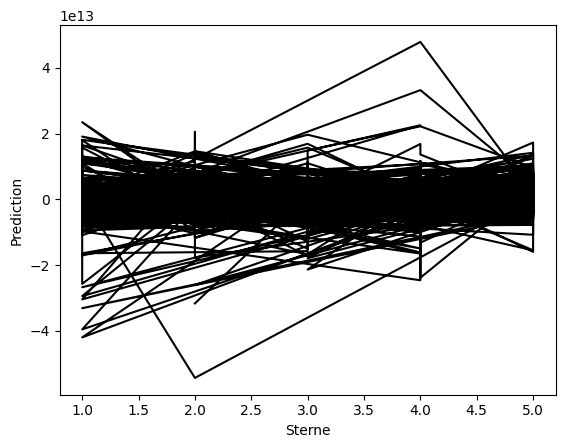

5

In [33]:

#plt.scatter(X_test, Y_test,color='g')
plt.plot(Y_test, predictions,color='k')
plt.xlabel("Sterne")
plt.ylabel("Prediction")

plt.show()

numpy.max(Y_test)

In [34]:
nb = MultinomialNB()
nb.fit(X_train, Y_train)

MultinomialNB()

In [35]:
Y_predict = nb.predict(X_test)
df=pandas.DataFrame()
df["predictions"]=Y_predict
df["Y_test"]=Y_test
print(df)

# plt.scatter(Y_test, Y_predict,color='k')
# plt.xlabel("Sterne")
# plt.ylabel("Prediction")

# plt.show()

# plt.imshow([Y_test,Y_predict], cmap='hot', interpolation='nearest')
# plt.show()
kernel=stats.gaussian_kde([df["predictions"],df["Y_test"]])
df["z"]=kernel([df["predictions"],df["Y_test"]])

fig=px.scatter(df,x=df["predictions"],y=df["Y_test"],color="z",color_continuous_scale=px.colors.sequential.Bluered)
fig.update_layout(xaxis_title="predictions",yaxis_title="Ratings")
fig.show()

mse=numpy.mean((Y_predict-Y_test)**2)
mse

     predictions  Y_test
0              2       2
1              5       3
2              4       3
3              1       2
4              2       1
..           ...     ...
995            4       5
996            2       3
997            4       4
998            5       3
999            2       2

[1000 rows x 2 columns]


1.601